# Fine-Tuning Sentence-BERT for AI-Generated Text Detection

This notebook fine-tunes a Sentence-BERT (SBERT) model on the `qingy2024/De-GPT-DPO` dataset to classify text as human-like (chosen responses, label 0) or AI-generated (rejected responses, label 1). The dataset contains prompts with paired chosen and rejected responses, ideal for distinguishing AI-generated text (e.g., from GPT models).

Based on the user-provided example #13:
- **Prompt**: "Why can't we use a centrifuge to de-salinate ocean water?"
- **Chosen**: Human-like response (label 0).
- **Rejected**: AI-generated or lower-quality response (label 1).

The notebook includes data loading, preprocessing, model training, evaluation, and testing.

## Step 1: Install Required Libraries
Install `sentence-transformers` and `datasets` for model training and data handling.

In [ ]:
!pip install datasets==3.6.0 fsspec==2025.3.0 gcsfs==2025.3.0

## Step 2: Load the Dataset
Load the `qingy2024/De-GPT-DPO` dataset from Hugging Face and inspect its structure.

In [ ]:
from datasets import load_dataset

# Load the dataset
dataset = load_dataset("qingy2024/De-GPT-DPO")
train_data = dataset['train']

# Inspect dataset
print("Dataset features:", train_data.features)
print("First example:", train_data[0])
print(f"Total training samples: {len(train_data)}")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/505 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


train-00000-of-00001.parquet:   0%|          | 0.00/45.0M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/44730 [00:00<?, ? examples/s]

Dataset features: {'prompt': Value(dtype='string', id=None), 'chosen': [{'content': Value(dtype='string', id=None), 'role': Value(dtype='string', id=None)}], 'rejected': [{'content': Value(dtype='string', id=None), 'role': Value(dtype='string', id=None)}]}
First example: {'prompt': 'in football whats the point of wasting the first two plays with a rush - up the middle - not regular rush plays i get those', 'chosen': [{'content': 'in football whats the point of wasting the first two plays with a rush - up the middle - not regular rush plays i get those', 'role': 'user'}, {'content': "Keep the defense honest, get a feel for the pass rush, open up the passing game. An offense that's too one dimensional will fail. And those rushes up the middle can be busted wide open sometimes for big yardage.", 'role': 'assistant'}], 'rejected': [{'content': 'in football whats the point of wasting the first two plays with a rush - up the middle - not regular rush plays i get those', 'role': 'user'}, {'co

## Step 3: Prepare Data for SBERT
Convert dataset entries into `InputExample` objects. Each `chosen` response is labeled 0 (human-like), and each `rejected` response is labeled 1 (AI-generated). Filter out empty or short responses for quality.

In [ ]:
from sentence_transformers import InputExample

train_samples = []
for item in train_data:
    chosen_data = item.get('chosen')
    rejected_data = item.get('rejected')

    # Debug: Print items to identify issues
    print(f"Processing item: chosen='{chosen_data}', rejected='{rejected_data}'")

    chosen_assistant_text = None
    rejected_assistant_text = None

    # Extract assistant's response from chosen data
    if isinstance(chosen_data, list) and len(chosen_data) > 1:
        for turn in chosen_data:
            if isinstance(turn, dict) and turn.get('role') == 'assistant':
                chosen_assistant_text = turn.get('content')
                break # Assuming the first assistant turn is the one we want

    # Extract assistant's response from rejected data
    if isinstance(rejected_data, list) and len(rejected_data) > 1:
        for turn in rejected_data:
            if isinstance(turn, dict) and turn.get('role') == 'assistant':
                rejected_assistant_text = turn.get('content')
                break # Assuming the first assistant turn is the one we want


    # Add chosen response (human-like, label 0)
    if chosen_assistant_text and isinstance(chosen_assistant_text, str) and len(chosen_assistant_text.strip()) > 10:
        train_samples.append(InputExample(texts=[chosen_assistant_text], label=0.0))
    else:
        print(f"Skipped chosen: '{chosen_assistant_text}' (invalid or too short)")

    # Add rejected response (AI-generated, label 1)
    if rejected_assistant_text and isinstance(rejected_assistant_text, str) and len(rejected_assistant_text.strip()) > 10:
        train_samples.append(InputExample(texts=[rejected_assistant_text], label=1.0))
    else:
        print(f"Skipped rejected: '{rejected_assistant_text}' (invalid or too short)")

print(f"Total training samples prepared: {len(train_samples)}")

Streaming output truncated to the last 5000 lines.
Processing item: chosen='[{'content': 'How do people living in poverty afford rent downtown?', 'role': 'user'}, {'content': 'Homeless people you mean? If they\'re not homeless, there are always run down buildings that don\'t get caught up in downtown gentrification. The high rent downtown scene was not always like that in most big cities, it\'s only been maybe the past 10-15 years that living "downtown" has become desirable to people with more disposable income. Through the 70\'s and 80\'s downtown was a dangerous place to be and everyone fled to the suburbs.', 'role': 'assistant'}]', rejected='[{'content': 'How do people living in poverty afford rent downtown?', 'role': 'user'}, {'content': 'People living in poverty often struggle to afford rent downtown due to the rising costs associated with gentrification. However, some individuals may find affordable housing options in run-down buildings that are not yet affected by the gentrifica

## Step 4: Load the SBERT Model
Use `all-MiniLM-L6-v2` for efficient training. For better accuracy, you can switch to `all-mpnet-base-v2`.

In [ ]:
from sentence_transformers import SentenceTransformer

model = SentenceTransformer('all-MiniLM-L6-v2')  # Lightweight and effective
# Alternative: model = SentenceTransformer('all-mpnet-base-v2') for higher accuracy

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

## Step 5: Set Up DataLoader and Loss Function
Use `SoftmaxLoss` for binary classification (human-like vs. AI-generated).

In [ ]:
from sentence_transformers import InputExample

train_samples = []
for item in train_data:
    chosen_data = item.get('chosen')
    rejected_data = item.get('rejected')

    # Debug: Print items to identify issues
    print(f"Processing item: chosen='{chosen_data}', rejected='{rejected_data}'")

    chosen_assistant_text = None
    rejected_assistant_text = None

    # Extract assistant's response from chosen data
    if isinstance(chosen_data, list) and len(chosen_data) > 1:
        for turn in chosen_data:
            if isinstance(turn, dict) and turn.get('role') == 'assistant':
                chosen_assistant_text = turn.get('content')
                break # Assuming the first assistant turn is the one we want

    # Extract assistant's response from rejected data
    if isinstance(rejected_data, list) and len(rejected_data) > 1:
        for turn in rejected_data:
            if isinstance(turn, dict) and turn.get('role') == 'assistant':
                rejected_assistant_text = turn.get('content')
                break # Assuming the first assistant turn is the one we want

    # Debug: Print extracted text before adding to samples
    print(f"Extracted chosen_assistant_text: '{chosen_assistant_text}'")
    print(f"Extracted rejected_assistant_text: '{rejected_assistant_text}'")

    # Add chosen response (human-like, label 0)
    if chosen_assistant_text and isinstance(chosen_assistant_text, str) and len(chosen_assistant_text.strip()) > 10:
        train_samples.append(InputExample(texts=[chosen_assistant_text], label=0.0))
    else:
        print(f"Skipped chosen: '{chosen_assistant_text}' (invalid or too short)")

    # Add rejected response (AI-generated, label 1)
    if rejected_assistant_text and isinstance(rejected_assistant_text, str) and len(rejected_assistant_text.strip()) > 10:
        train_samples.append(InputExample(texts=[rejected_assistant_text], label=1.0))
    else:
        print(f"Skipped rejected: '{rejected_assistant_text}' (invalid or too short)")

print(f"Total training samples prepared: {len(train_samples)}")

Streaming output truncated to the last 5000 lines.
Extracted chosen_assistant_text: 'It's just a case of cold numbing your sense of taste, so that what is still there at low temperatures, is only strongly sensed at warmer temps. You'll find that it's harder to taste *anything* when it's cold... that goes for dissolved stuff in water too.'
Extracted rejected_assistant_text: 'The perception of taste in water is influenced by temperature, with chilled water often appearing tasteless and room temperature water sometimes exhibiting odd flavors. This phenomenon can be attributed to the numbing effect of cold temperatures on the sense of taste. When water is chilled, the cold temperature reduces the sensitivity of the taste buds on the tongue, making it more difficult to perceive flavors. As a result, dissolved substances in the water, such as minerals or impurities, are less noticeable when the water is cold. In contrast, room temperature water allows the taste buds to function more effectiv

## Step 6: Fine-Tune the Model
Train for 5 epochs with warmup steps to stabilize training.

In [ ]:
from sentence_transformers import SentenceTransformer, InputExample
from torch.utils.data import DataLoader
import torch
import torch.nn as nn
from sentence_transformers.models import Dense, Transformer, Pooling

# Custom collate function
def custom_collate_fn(batch):
    texts = [example.texts[0] for example in batch]  # Extract single text from texts list
    labels = torch.tensor([example.label for example in batch], dtype=torch.long)  # Extract labels
    return {'texts': texts, 'labels': labels}

# Assuming train_samples is prepared from your previous cell
if not train_samples:
    raise ValueError("train_samples is empty. Cannot create DataLoader.")

# Set device consistently
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Create DataLoader with custom collate function
batch_size = 16  # Adjust batch size as needed
train_dataloader = DataLoader(train_samples, shuffle=True, batch_size=batch_size, collate_fn=custom_collate_fn)

# Initialize base Sentence-BERT model
base_model = SentenceTransformer('all-MiniLM-L6-v2')
base_model.to(device)  # Move base model to device

# Access the underlying modules
word_embedding_model = None
pooling_model = None

for module in base_model._modules.values():
    if isinstance(module, Transformer):
        word_embedding_model = module
    if isinstance(module, Pooling):
        pooling_model = module

if word_embedding_model is None:
    raise ValueError("Could not find the Transformer module in the base model.")
if pooling_model is None:
     raise ValueError("Could not find the Pooling module in the base model.")

# Define the classification head
embedding_dim = pooling_model.get_sentence_embedding_dimension()
classifier_head = nn.Linear(embedding_dim, 2)  # Use PyTorch's Linear layer
classifier_head.to(device)  # Move classifier to device

# Create a new SentenceTransformer model using word_embedding and pooling
model = SentenceTransformer(modules=[word_embedding_model, pooling_model])
model.to(device)  # Move model to device

# Define loss function for classification
criterion = nn.CrossEntropyLoss()

# Define optimizer - include classifier_head parameters
optimizer = torch.optim.Adam(list(model.parameters()) + list(classifier_head.parameters()), lr=2e-5)

# Training loop
epochs = 20
warmup_steps = 100
total_steps = len(train_dataloader) * epochs
warmup_factor = 1.0 / warmup_steps

model.train()
classifier_head.train()

for epoch in range(epochs):
    print(f"Epoch {epoch + 1}/{epochs}")
    total_loss = 0
    for step, batch in enumerate(train_dataloader):
        # Adjust learning rate for warmup
        if step < warmup_steps:
            lr_scale = warmup_factor * step
            for param_group in optimizer.param_groups:
                param_group['lr'] = lr_scale * 2e-5

        # Extract texts and labels
        texts = batch['texts']
        labels = batch['labels'].to(device)  # Move labels to device

        # Zero gradients
        optimizer.zero_grad()

        # Forward pass through the model to get embeddings with device=device parameter
        embeddings = model.encode(texts, convert_to_tensor=True, show_progress_bar=False, device=device)

        # Ensure embeddings are on the correct device
        if not isinstance(embeddings, torch.Tensor):
            raise TypeError(f"Expected embeddings to be a tensor, got {type(embeddings)}")

        # Apply classifier to get logits (both now on same device)
        logits = classifier_head(embeddings)

        # Calculate loss
        loss = criterion(logits, labels)

        # Backward pass
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

        if step % 100 == 0:
            print(f"Step {step}/{len(train_dataloader)}, Loss: {loss.item():.4f}")

    avg_loss = total_loss / len(train_dataloader)
    print(f"Average loss for epoch {epoch + 1}: {avg_loss:.4f}")


Using device: cuda
Epoch 1/5
Step 0/5592, Loss: 0.7129
Step 100/5592, Loss: 0.6913
Step 200/5592, Loss: 0.7360
Step 300/5592, Loss: 0.7004
Step 400/5592, Loss: 0.6934
Step 500/5592, Loss: 0.6938
Step 600/5592, Loss: 0.6961
Step 700/5592, Loss: 0.6983
Step 800/5592, Loss: 0.7017
Step 900/5592, Loss: 0.6853
Step 1000/5592, Loss: 0.6879
Step 1100/5592, Loss: 0.7058
Step 1200/5592, Loss: 0.6676
Step 1300/5592, Loss: 0.6606
Step 1400/5592, Loss: 0.6921
Step 1500/5592, Loss: 0.7004
Step 1600/5592, Loss: 0.6812
Step 1700/5592, Loss: 0.6743
Step 1800/5592, Loss: 0.6812
Step 1900/5592, Loss: 0.6812
Step 2000/5592, Loss: 0.6944
Step 2100/5592, Loss: 0.6653
Step 2200/5592, Loss: 0.6597
Step 2300/5592, Loss: 0.6647
Step 2400/5592, Loss: 0.6588
Step 2500/5592, Loss: 0.6679
Step 2600/5592, Loss: 0.6707
Step 2700/5592, Loss: 0.6528
Step 2800/5592, Loss: 0.6585
Step 2900/5592, Loss: 0.6737
Step 3000/5592, Loss: 0.6770
Step 3100/5592, Loss: 0.6621
Step 3200/5592, Loss: 0.6670
Step 3300/5592, Loss: 0.67

In [ ]:
# Save the model and classifier
model_save_path = "sbert-degpt-finetuned"
model.save(model_save_path)

# Save the classifier separately
torch.save(classifier_head.state_dict(), f"{model_save_path}/classifier_head.pt")
print(f"Model and classifier saved to: {model_save_path}")

Model and classifier saved to: sbert-degpt-finetuned


## Step 8: Evaluate the Model
Test the model on example texts, including the one from example #13. Outputs probabilities for human-like vs. AI-generated.

Using device: cuda
Creating evaluation dataset from original data...
Processing 1000 examples for evaluation...
Collected 1000 human examples and 1000 AI examples
Final evaluation set: 2000 examples (1000 per class)
Limited evaluation set to 500 examples
Generating predictions...
Processing example 0/500...
Processing example 50/500...
Processing example 100/500...
Processing example 150/500...
Processing example 200/500...
Processing example 250/500...
Processing example 300/500...
Processing example 350/500...
Processing example 400/500...
Processing example 450/500...

===== MODEL EVALUATION METRICS =====
Accuracy: 0.7820
Precision: 0.7829
Recall: 0.8209
F1 Score: 0.8015
ROC AUC: 0.8571

Classification Report:
              precision    recall  f1-score   support

       Human       0.78      0.74      0.76       232
          AI       0.78      0.82      0.80       268

    accuracy                           0.78       500
   macro avg       0.78      0.78      0.78       500
weigh

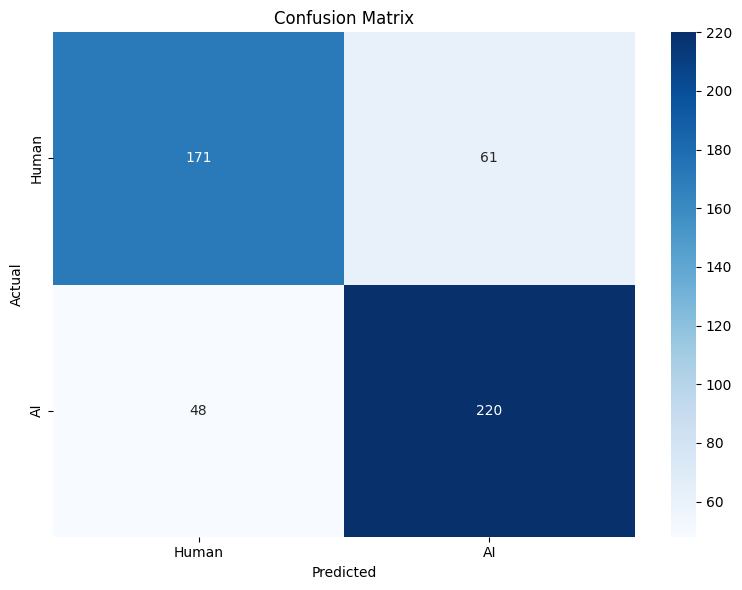

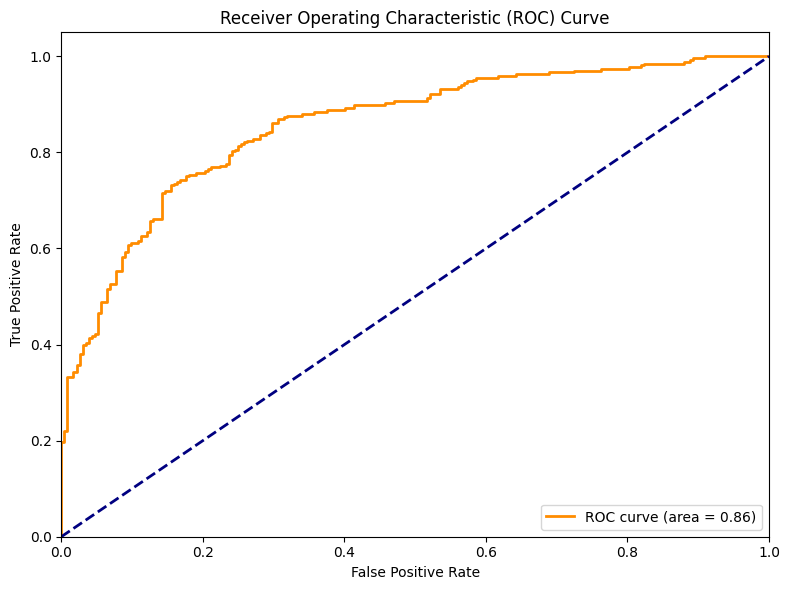

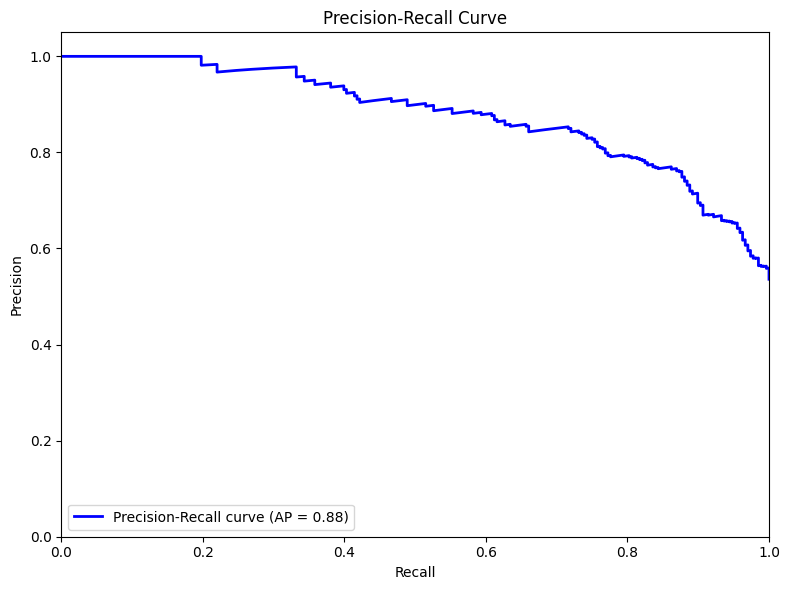


===== EXAMPLE-LEVEL ANALYSIS =====
Sample predictions (10 examples):

Example 439:
Text: The notion that our mouths can tolerate temperature extremes better than our skin is a common miscon...
True label: AI
Predicted: AI (Human prob: 0.32, AI prob: 0.68)
Correct: ✓

Example 126:
Text: The notion that bottled beer tastes better than canned beer may be attributed to the metallic taste ...
True label: AI
Predicted: AI (Human prob: 0.27, AI prob: 0.73)
Correct: ✓

Example 334:
Text: Your typical professionally-conducted presidential poll talks to around 1000 people; in the presiden...
True label: Human
Predicted: Human (Human prob: 0.57, AI prob: 0.43)
Correct: ✓

Example 319:
Text: The price of a stock is determined by the interaction between buyers and sellers in the market. This...
True label: AI
Predicted: AI (Human prob: 0.23, AI prob: 0.77)
Correct: ✓

Example 38:
Text: there is no benefit to carrying a balance. and even if there were, it still wouldnt make logical sen...
True labe

In [ ]:
import torch
import torch.nn as nn
import numpy as np
from sentence_transformers import SentenceTransformer
from datasets import load_dataset
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, classification_report
from sklearn.metrics import roc_curve, auc, confusion_matrix
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Load the fine-tuned base model
model = SentenceTransformer("sbert-degpt-finetuned")
model.to(device)

# Load the classifier head
embedding_dim = model.get_sentence_embedding_dimension()
classifier_head = nn.Linear(embedding_dim, 2)
classifier_head.load_state_dict(torch.load("sbert-degpt-finetuned/classifier_head.pt"))
classifier_head.to(device)
classifier_head.eval()

# Function for inference
def predict_text_source(text, model, classifier_head, device):
    # Encode the text
    embedding = model.encode(text, convert_to_tensor=True, device=device)
    # Get logits
    logits = classifier_head(embedding)
    # Get probabilities
    probs = torch.softmax(logits, dim=-1)
    return {
        "human_probability": probs[0].item(),
        "ai_probability": probs[1].item()
    }

# Create a larger evaluation dataset from the original dataset
print("Creating evaluation dataset from original data...")
dataset = load_dataset("qingy2024/De-GPT-DPO")
eval_data = dataset.get('validation', dataset.get('test', dataset['train']))

# Extract a subset for evaluation (to avoid processing the entire dataset)
eval_subset_size = min(1000, len(eval_data))
eval_indices = np.random.choice(len(eval_data), eval_subset_size, replace=False)
eval_subset = eval_data.select(eval_indices)

evaluation_data = []

print(f"Processing {eval_subset_size} examples for evaluation...")
for item in eval_subset:
    chosen_data = item.get('chosen')
    rejected_data = item.get('rejected')

    chosen_assistant_text = None
    rejected_assistant_text = None

    # Extract assistant's response from chosen data
    if isinstance(chosen_data, list) and len(chosen_data) > 1:
        for turn in chosen_data:
            if isinstance(turn, dict) and turn.get('role') == 'assistant':
                chosen_assistant_text = turn.get('content')
                break

    # Extract assistant's response from rejected data
    if isinstance(rejected_data, list) and len(rejected_data) > 1:
        for turn in rejected_data:
            if isinstance(turn, dict) and turn.get('role') == 'assistant':
                rejected_assistant_text = turn.get('content')
                break

    # Add human-like text (chosen response)
    if chosen_assistant_text and isinstance(chosen_assistant_text, str) and len(chosen_assistant_text.strip()) > 10:
        evaluation_data.append({"text": chosen_assistant_text, "label": 0})

    # Add AI-generated text (rejected response)
    if rejected_assistant_text and isinstance(rejected_assistant_text, str) and len(rejected_assistant_text.strip()) > 10:
        evaluation_data.append({"text": rejected_assistant_text, "label": 1})

# Ensure balance between classes
human_examples = [item for item in evaluation_data if item["label"] == 0]
ai_examples = [item for item in evaluation_data if item["label"] == 1]

print(f"Collected {len(human_examples)} human examples and {len(ai_examples)} AI examples")

# Balance the dataset by taking the minimum count from both classes
min_count = min(len(human_examples), len(ai_examples))
human_examples = human_examples[:min_count]
ai_examples = ai_examples[:min_count]

balanced_eval_data = human_examples + ai_examples
np.random.shuffle(balanced_eval_data)

print(f"Final evaluation set: {len(balanced_eval_data)} examples ({min_count} per class)")

# If the balanced dataset is still too large, limit it
max_eval_size = 500
if len(balanced_eval_data) > max_eval_size:
    balanced_eval_data = balanced_eval_data[:max_eval_size]
    print(f"Limited evaluation set to {max_eval_size} examples")

# Get predictions and calculate metrics
y_true = []
y_pred = []
y_scores = []

# Generate predictions for each item in the evaluation data
print("Generating predictions...")
for idx, item in enumerate(balanced_eval_data):
    if idx % 50 == 0:
        print(f"Processing example {idx}/{len(balanced_eval_data)}...")

    try:
        result = predict_text_source(item["text"], model, classifier_head, device)
        predicted_label = 1 if result["ai_probability"] > result["human_probability"] else 0

        y_true.append(item["label"])
        y_pred.append(predicted_label)
        y_scores.append(result["ai_probability"])
    except Exception as e:
        print(f"Error processing example {idx}: {str(e)}")

# Calculate basic metrics
accuracy = accuracy_score(y_true, y_pred)
precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred, average='binary')
report = classification_report(y_true, y_pred, target_names=['Human', 'AI'])

# Calculate ROC curve and AUC
fpr, tpr, _ = roc_curve(y_true, y_scores)
roc_auc = auc(fpr, tpr)

# Calculate confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Print metrics
print("\n===== MODEL EVALUATION METRICS =====")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC AUC: {roc_auc:.4f}")
print("\nClassification Report:")
print(report)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Human', 'AI'],
            yticklabels=['Human', 'AI'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.savefig('confusion_matrix.png')
plt.show()

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.tight_layout()
plt.savefig('roc_curve.png')
plt.show()

# Calculate precision-recall curve
precision_curve, recall_curve, _ = precision_recall_curve(y_true, y_scores)
average_precision = average_precision_score(y_true, y_scores)

# Plot precision-recall curve
plt.figure(figsize=(8, 6))
plt.plot(recall_curve, precision_curve, color='blue', lw=2,
         label=f'Precision-Recall curve (AP = {average_precision:.2f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall Curve')
plt.legend(loc="lower left")
plt.tight_layout()
plt.savefig('precision_recall_curve.png')
plt.show()

# Example-level analysis
print("\n===== EXAMPLE-LEVEL ANALYSIS =====")
print("Sample predictions (10 examples):")

num_samples = min(10, len(y_true))
sample_indices = np.random.choice(len(y_true), num_samples, replace=False)

for idx in sample_indices:
    true_label = "Human" if y_true[idx] == 0 else "AI"
    pred_label = "Human" if y_pred[idx] == 0 else "AI"
    correct = true_label == pred_label

    print(f"\nExample {idx}:")
    print(f"Text: {balanced_eval_data[idx]['text'][:100]}...")
    print(f"True label: {true_label}")
    print(f"Predicted: {pred_label} (Human prob: {1-y_scores[idx]:.2f}, AI prob: {y_scores[idx]:.2f})")
    print(f"Correct: {'✓' if correct else '✗'}")

## Step 9: Optional Validation
If the dataset includes a validation split, evaluate the model’s performance. Uncomment to use.

In [ ]:
# from sentence_transformers.evaluation import BinaryClassificationEvaluator
# if 'validation' in dataset:
#     val_data = dataset['validation']
#     val_samples = []
#     for item in val_data:
#         if item['chosen'] and len(item['chosen']) > 10:
#             val_samples.append(InputExample(texts=[item['chosen']], label=0.0))
#         if item['rejected'] and len(item['rejected']) > 10:
#             val_samples.append(InputExample(texts=[item['rejected']], label=1.0))
#     evaluator = BinaryClassificationEvaluator(val_samples)
#     model.evaluate(evaluator)

## Notes
- **Dataset**: Ensure `qingy2024/De-GPT-DPO` is accessible. Use a Hugging Face token if needed (set in environment or Colab secrets).
- **Compute**: A GPU (e.g., T4) is recommended for faster training.
- **Improvements**: Try `all-mpnet-base-v2` for better accuracy, adjust `batch_size` (16 or 64), or increase `epochs` (3–10) based on validation.
- **Augmentation**: If the dataset is small, generate additional AI text using `gpt2` or similar models.
- **Deployment**: For production, consider xAI’s API (https://x.ai/api).